# Compare online versus offline mapping in NUOPC

This notebook compares hourly history files from simulations with mapping files generated offline versus those with mapping files generated online. Both C- and G-compsets are tested.

<b>NOTES:</b> 

1) the default (out-of-the-box) vector mapping file in the offline method is blin, while in the online method it is patch. Therefore, when comparing solutions one needs to change one of the methods to match the other. Perferable, vector mapping should be patch. Here, however, I've set Sa_u/Sa_v to mapbilnr in SourceMods/src.drv/esmFldsExchange.F90;

2) CPL_ALBAV = FALSE by default in NUOPC simulations. This must be set to True.

3) Need to change coupling interval to 1 hour in the NUOPC C compset.

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from mom6_tools.m6plot import xycompare
from mom6_tools.MOM6grid import MOM6grid

In [2]:
grd = MOM6grid('/glade/scratch/gmarques/c.c2b6.CNYF.T62_t061.nuopc_dev_ncar/run/c.c2b6.CNYF.T62_t061.nuopc_dev_ncar.mom6.static.nc')

MOM6 grid successfully loaded... 



## Online mapping

In [3]:
online_c = xr.open_mfdataset("/glade/scratch/gmarques/c.c2b6.CNYF.T62_t061.online_mapping/run/*.cpl.hi.*.nc", decode_times=False)
online_g = xr.open_mfdataset("/glade/scratch/gmarques/g.c2b6.GNYF.T62_t061.online_mapping/run/*.cpl.hi.*.nc", decode_times=False)

## Offline mapping

In [4]:
offline_c = xr.open_mfdataset("/glade/scratch/gmarques/c.c2b6.CNYF.T62_t061.nuopc_dev_ncar/run/*.cpl.hi.*.nc", decode_times=False)
offline_g = xr.open_mfdataset("/glade/scratch/gmarques/g.c2b6.GNYF.T62_t061.nuopc_dev_ncar/run/*.cpl.hi.*.nc", decode_times=False)

### Fields to be compared

In [1]:
pairs = [
("ocnExp_Faxa_rain"),
("ocnExp_Faxa_snow"),
("ocnExp_Fioi_melth"),
("ocnExp_Fioi_meltw"),
("ocnExp_Fioi_salt"),
("ocnExp_Foxx_evap"),
("ocnExp_Foxx_rofi"),
("ocnExp_Foxx_rofl"),
("ocnExp_Foxx_sen"),
("ocnExp_Foxx_taux"),
("ocnExp_Foxx_tauy"),
("ocnExp_Sa_pslv"),
("ocnExp_Foxx_swnet_idf"),
("ocnExp_Foxx_swnet_idr"),
("ocnExp_Foxx_swnet_vdf"),
("ocnExp_Foxx_swnet_vdr"),
("ocnExp_Foxx_lwnet"),
("ocnImp_So_s"),
("ocnImp_So_t"),
("ocnImp_So_u"),
("ocnImp_So_v"),
("ocnImp_So_dhdx"),
("ocnImp_So_dhdy"),
("ocnImp_So_bldepth"),
("ocnImp_So_omask"),
("ocnImp_Fioo_q")
]    

online C time (days) =  0.041666666666666664
offline C time (days) =  0.041666666666666664
online G time (days) =  0.041666666666666664
offline G time (days) =  0.041666666666666664


/glade/u/home/gmarques/miniconda3/envs/analysis/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


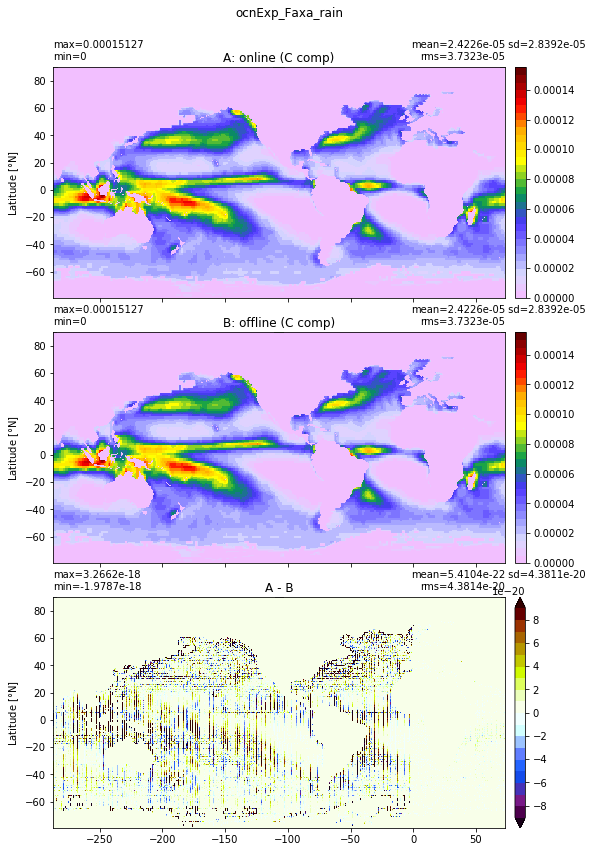

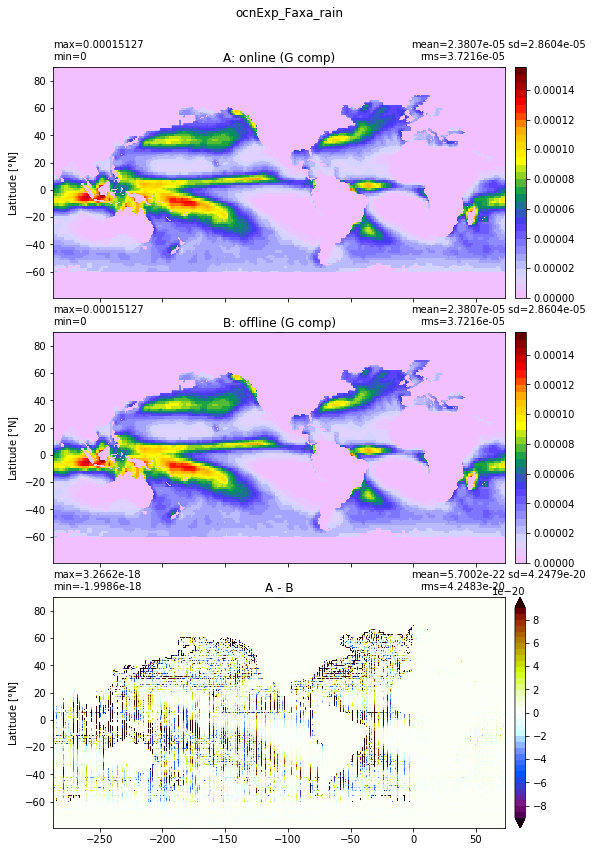

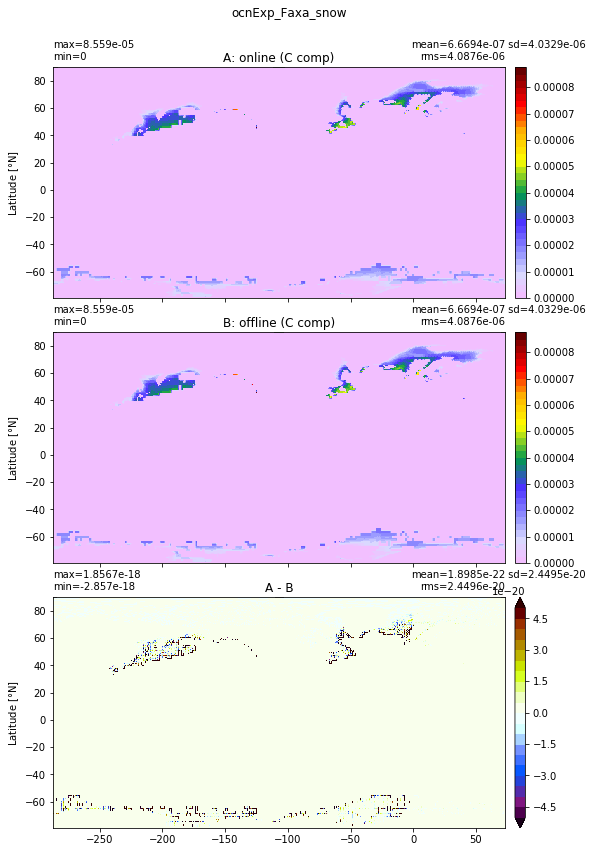

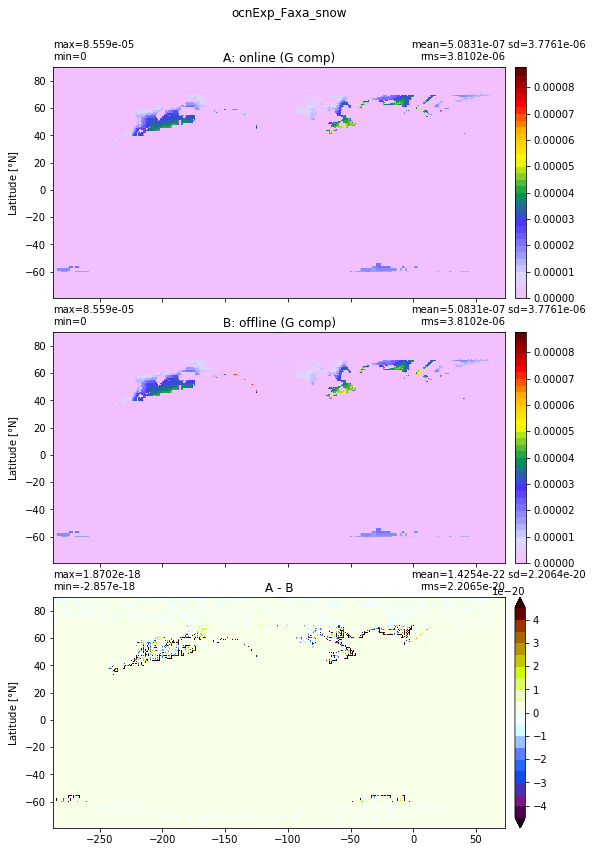

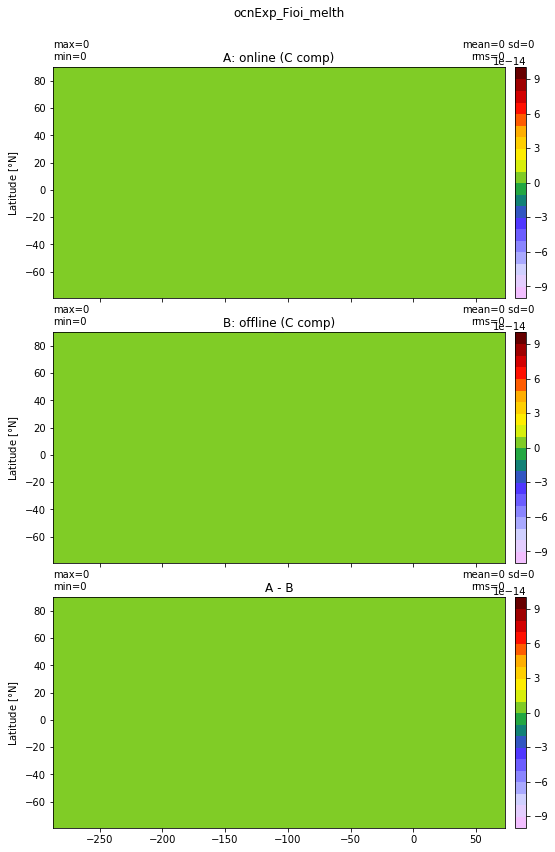

...

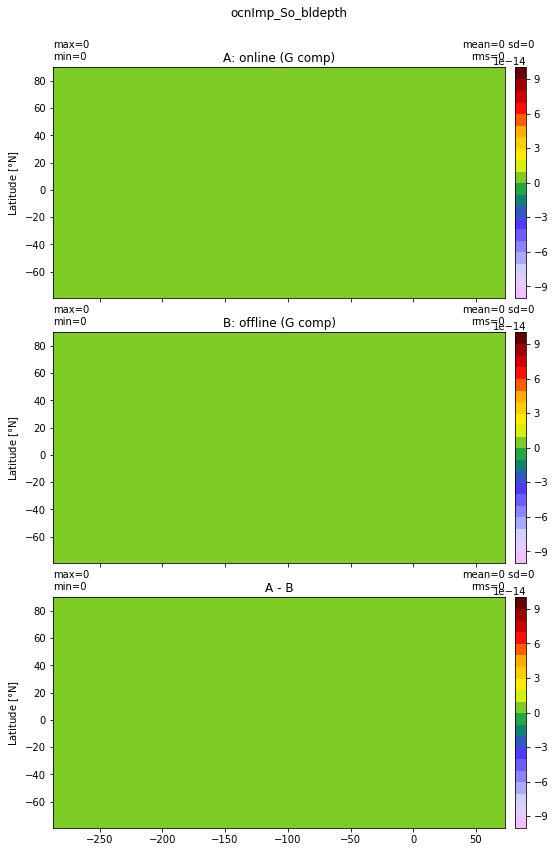

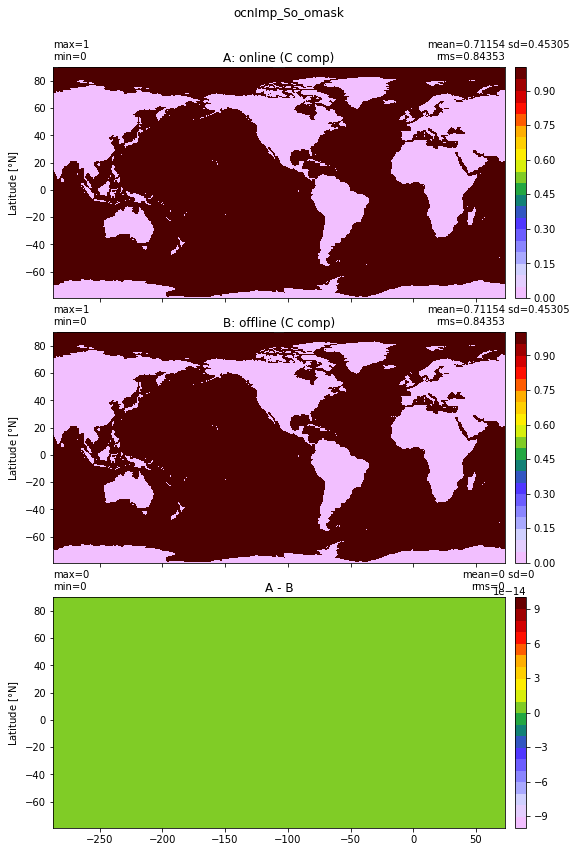

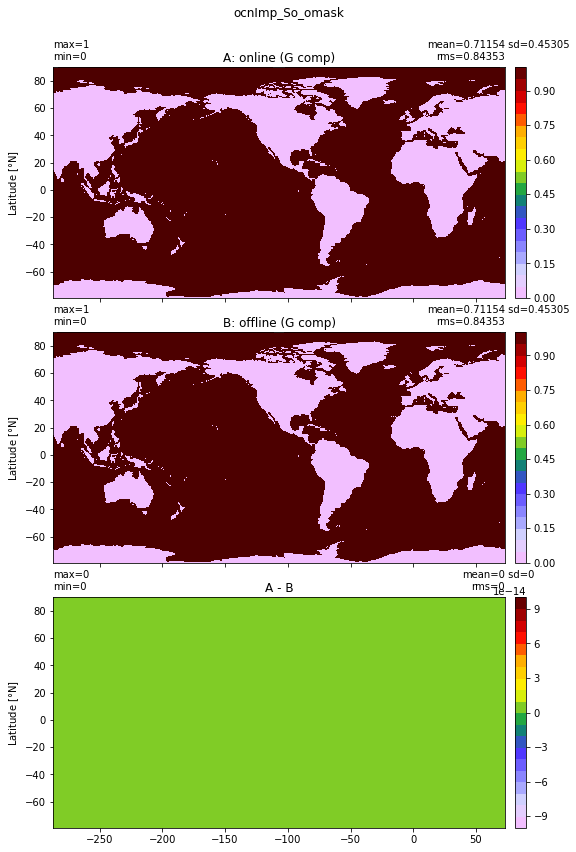

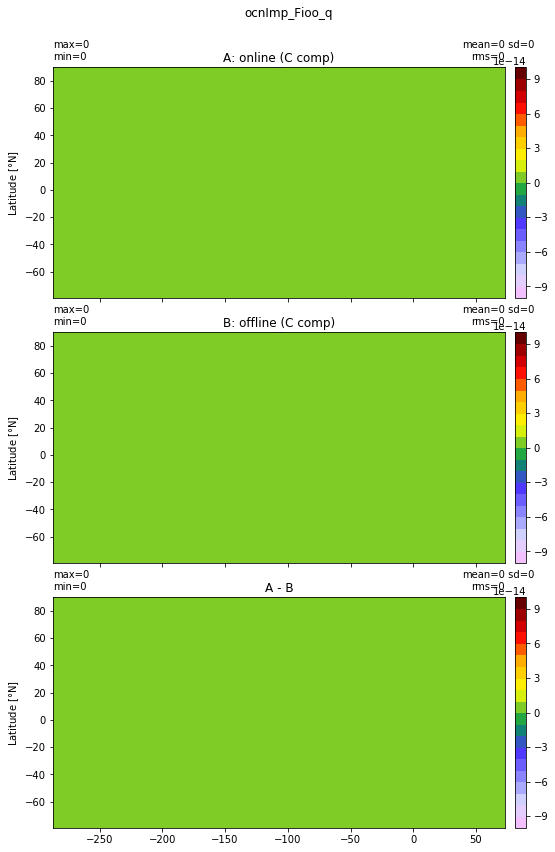

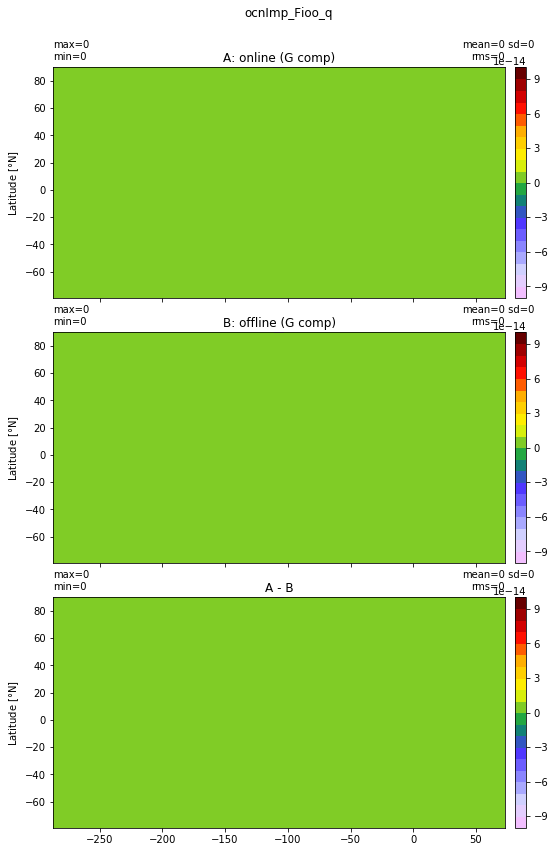

In [6]:
t = 0 # time indice
print('online C time (days) = ',online_c['time'][t].data)
print('offline C time (days) = ',offline_c['time'][t].data)
print('online G time (days) = ',online_g['time'][t].data)
print('offline G time (days) = ',offline_g['time'][t].data)

for p in range(len(pairs)):
    #print(pairs[p])
    online_var = online_c[pairs[p][0]][t,:].data
    offline_var = offline_c[pairs[p][0]][t,:].data
    xycompare(online_var, offline_var, x=grd.geolon, y=grd.geolat, area=grd.area_t, title1='online (C comp)', title2='offline (C comp)', suptitle=pairs[p][0])
    online_var = online_g[pairs[p][0]][t,:].data
    offline_var = offline_g[pairs[p][0]][t,:].data
    xycompare(online_var, offline_var, x=grd.geolon, y=grd.geolat, area=grd.area_t, title1='online (G comp)', title2='offline (G comp)', suptitle=pairs[p][0])

online C time (days) =  0.08333333333333333
offline C time (days) =  0.08333333333333333
online G time (days) =  0.08333333333333333
offline G time (days) =  0.08333333333333333


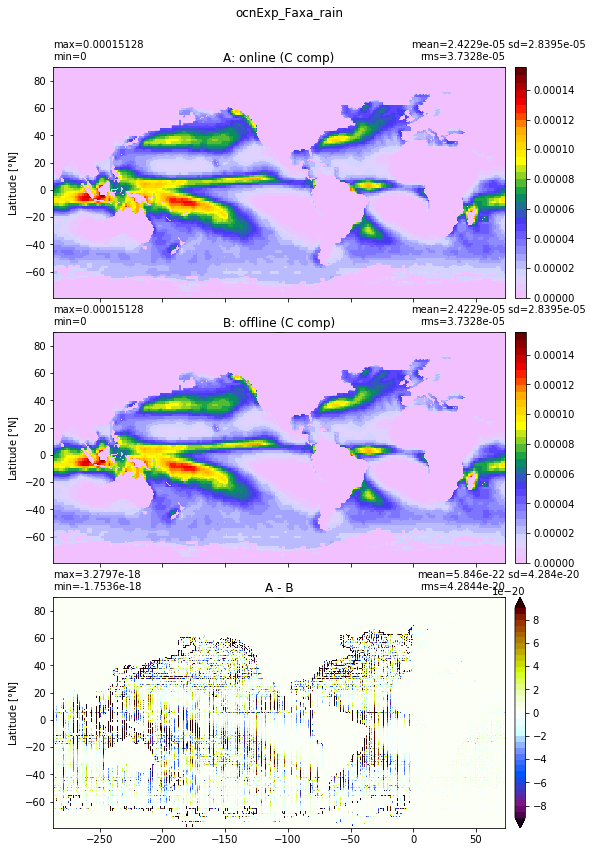

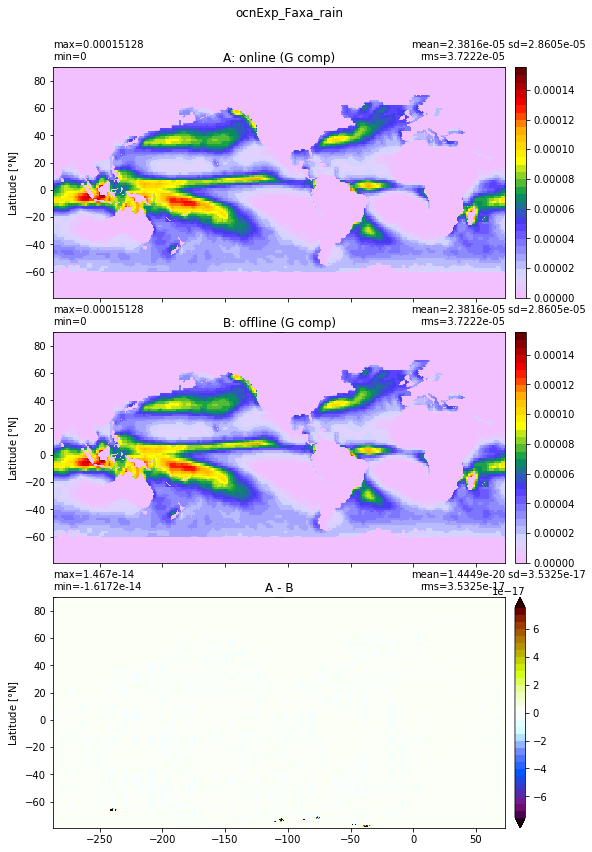

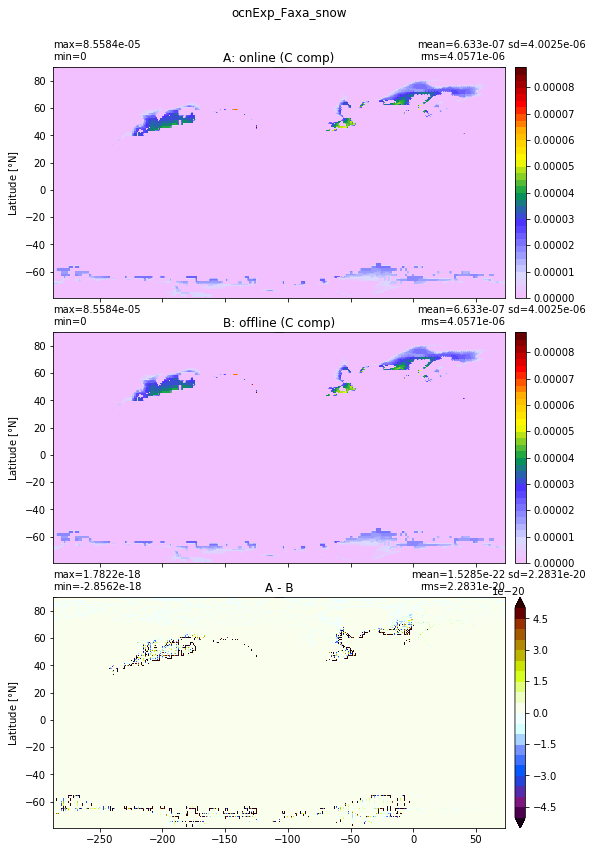

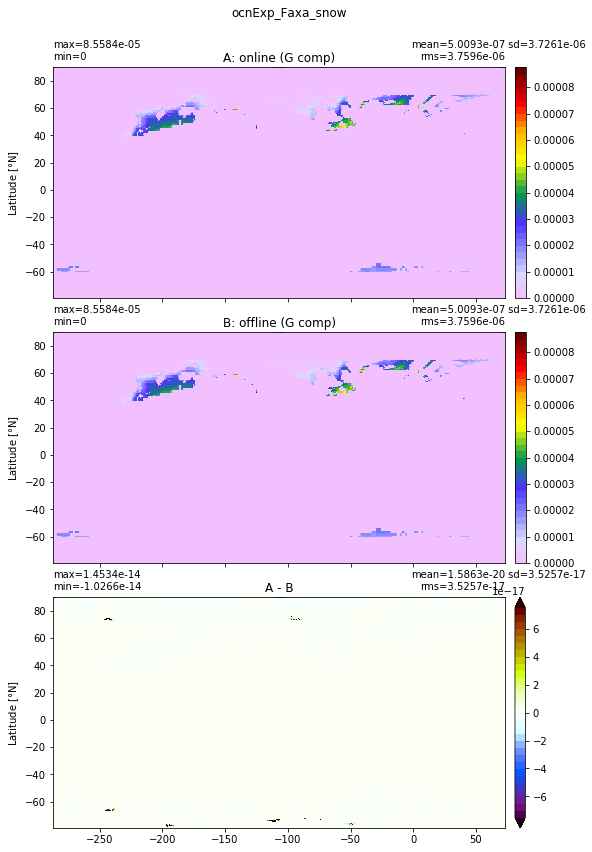

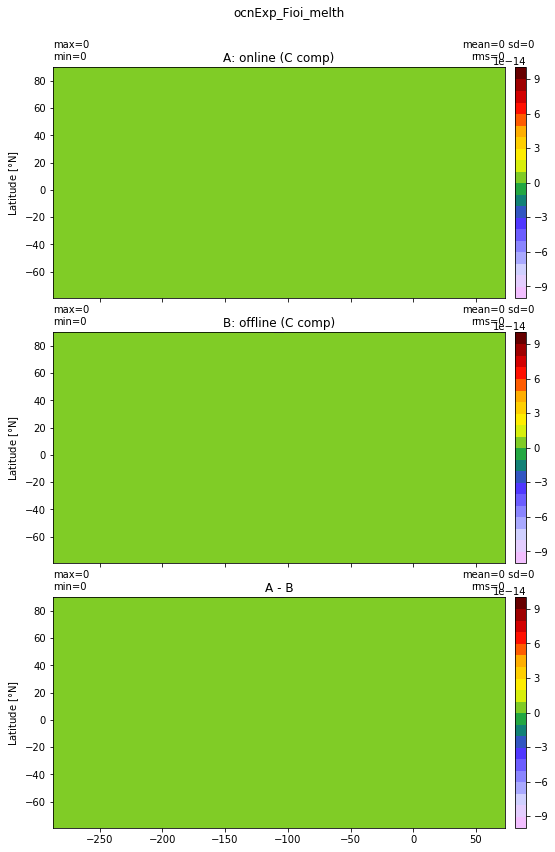

...

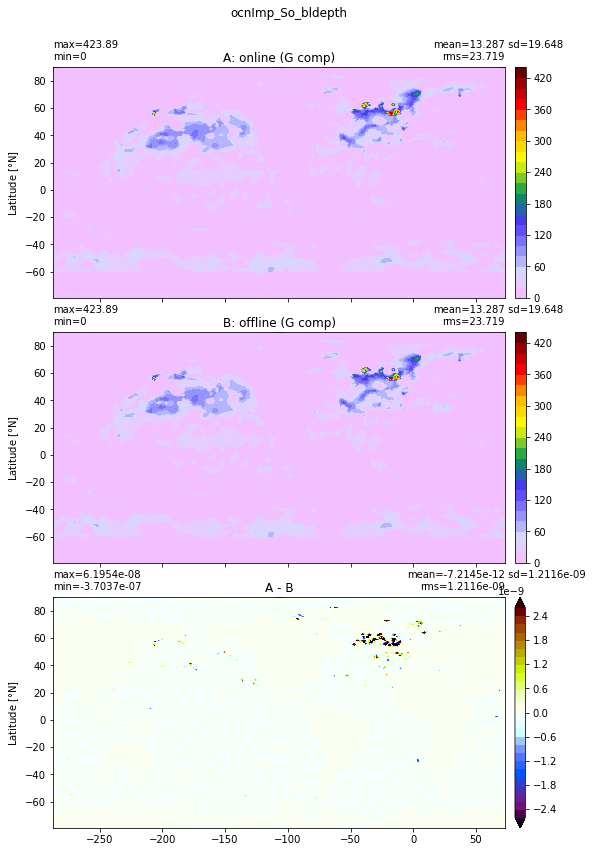

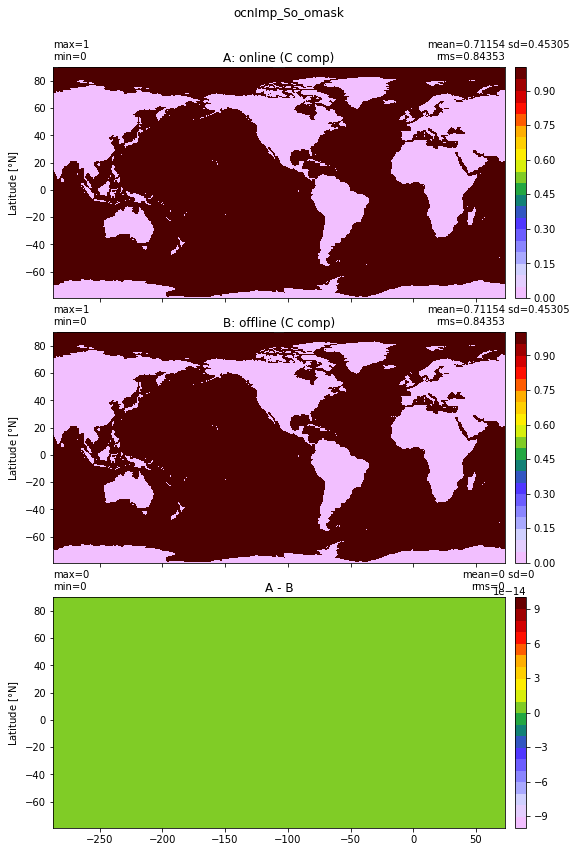

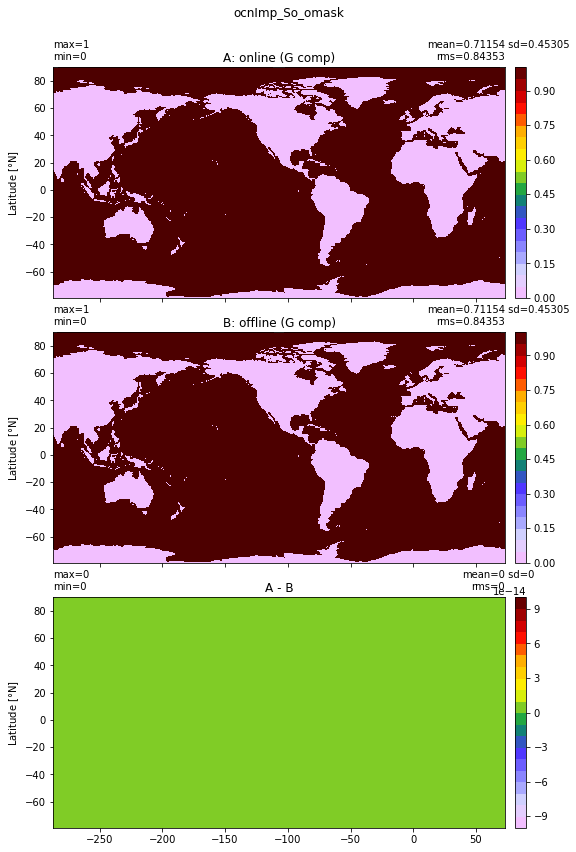

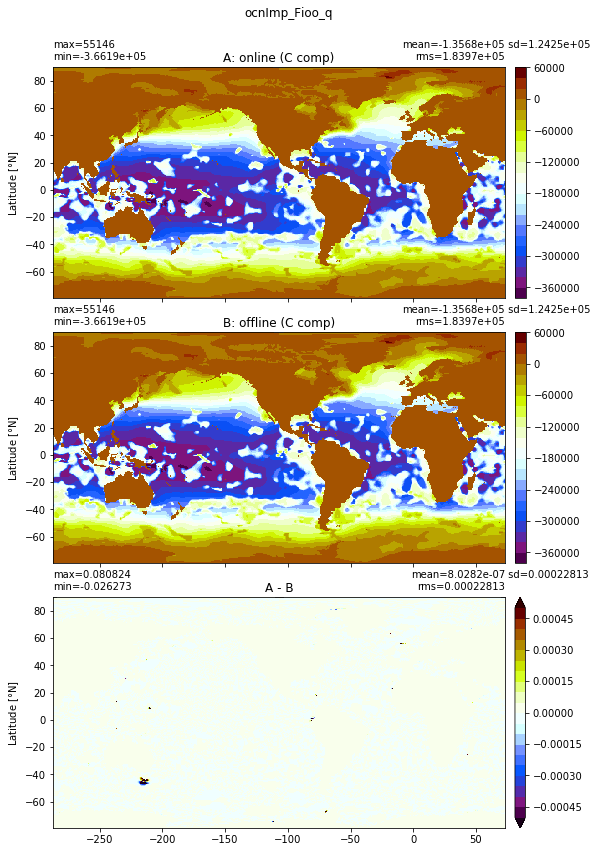

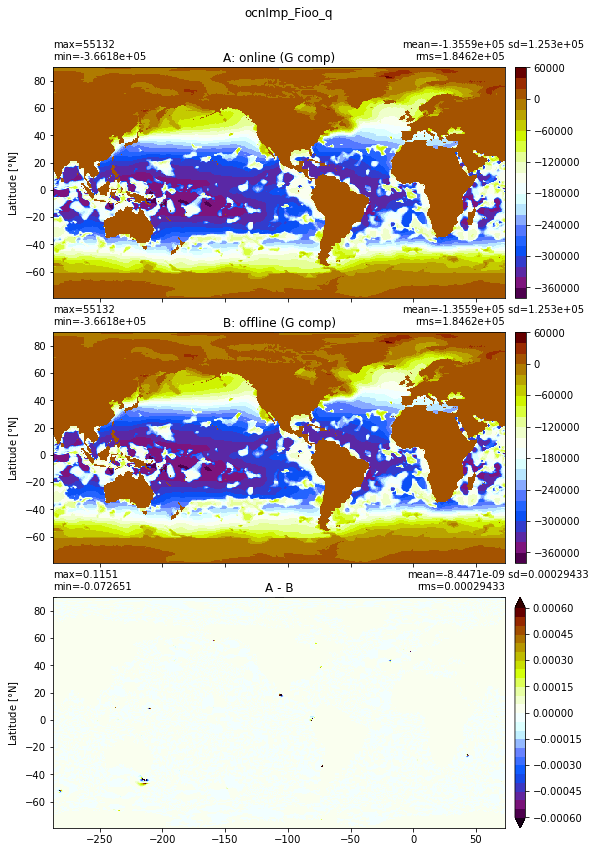

In [8]:
t = 1 # time indice
print('online C time (days) = ',online_c['time'][t].data)
print('offline C time (days) = ',offline_c['time'][t].data)
print('online G time (days) = ',online_g['time'][t].data)
print('offline G time (days) = ',offline_g['time'][t].data)

for p in range(len(pairs)):
    #print(pairs[p])
    online_var = online_c[pairs[p][0]][t,:].data
    offline_var = offline_c[pairs[p][0]][t,:].data
    xycompare(online_var, offline_var, x=grd.geolon, y=grd.geolat, area=grd.area_t, title1='online (C comp)', title2='offline (C comp)', suptitle=pairs[p][0])
    online_var = online_g[pairs[p][0]][t,:].data
    offline_var = offline_g[pairs[p][0]][t,:].data
    xycompare(online_var, offline_var, x=grd.geolon, y=grd.geolat, area=grd.area_t, title1='online (G comp)', title2='offline (G comp)', suptitle=pairs[p][0])

online C time (days) =  5.0
offline C time (days) =  5.0
online G time (days) =  5.0
offline G time (days) =  5.0


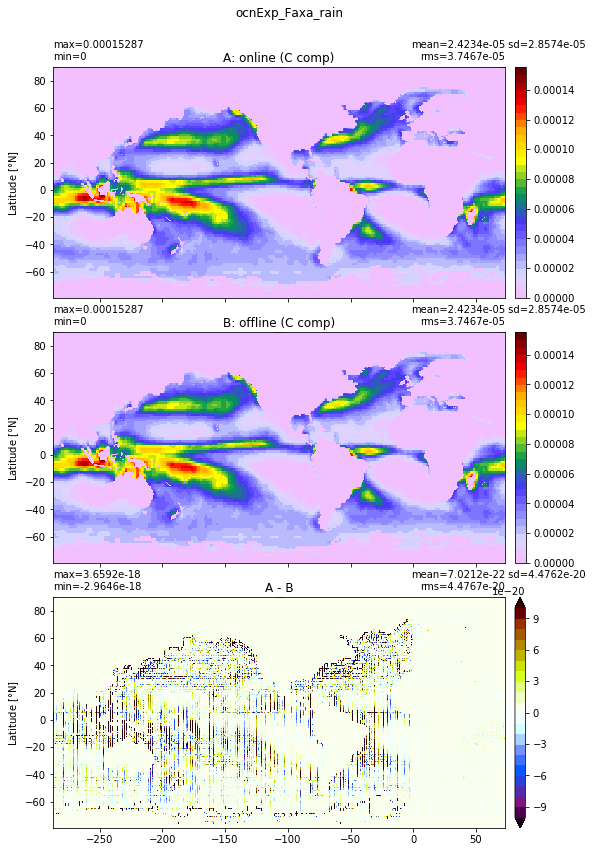

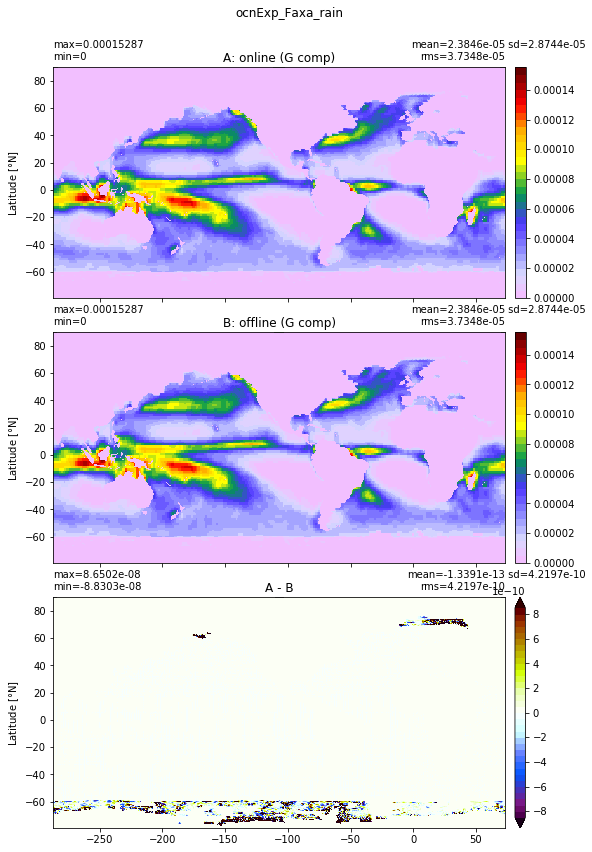

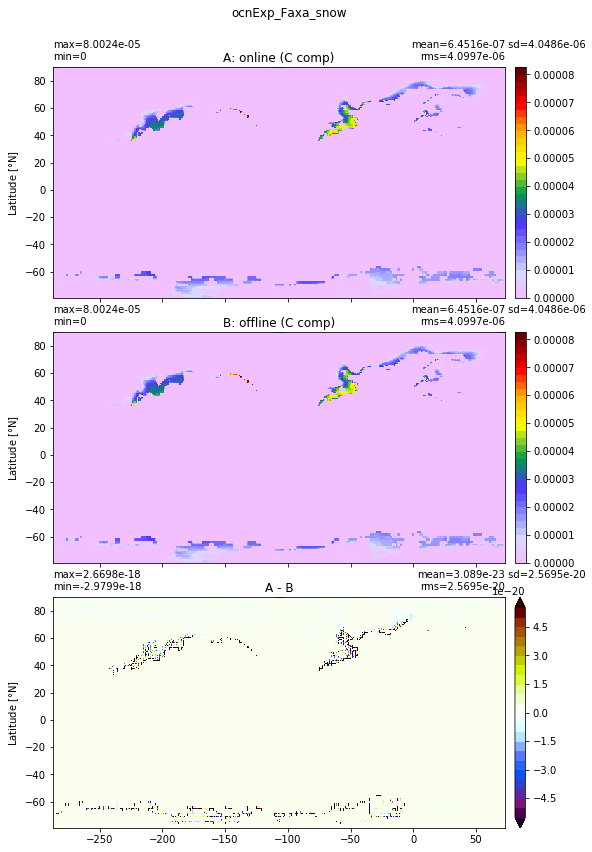

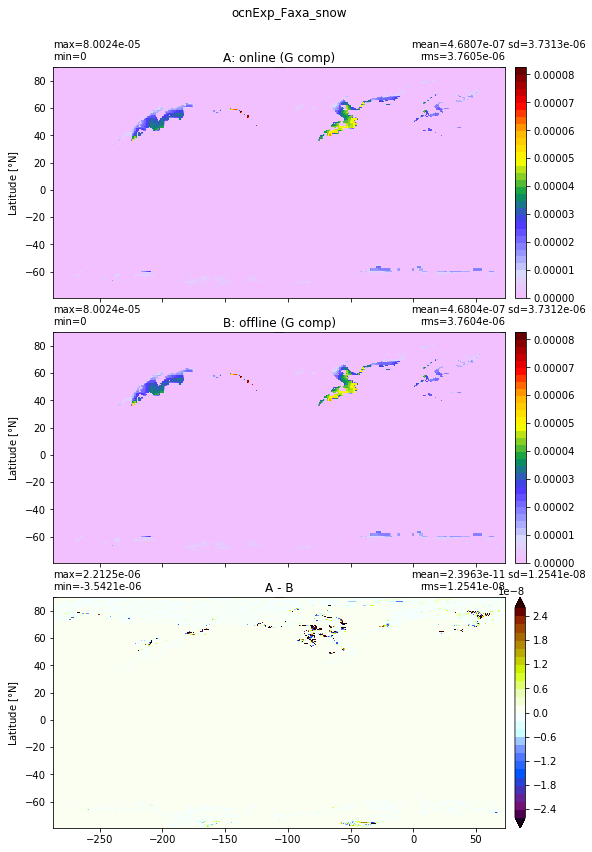

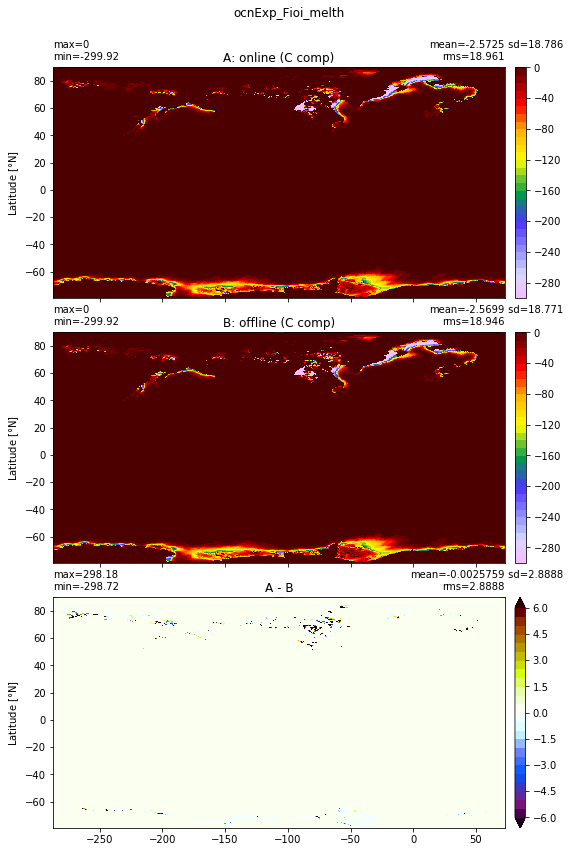

...

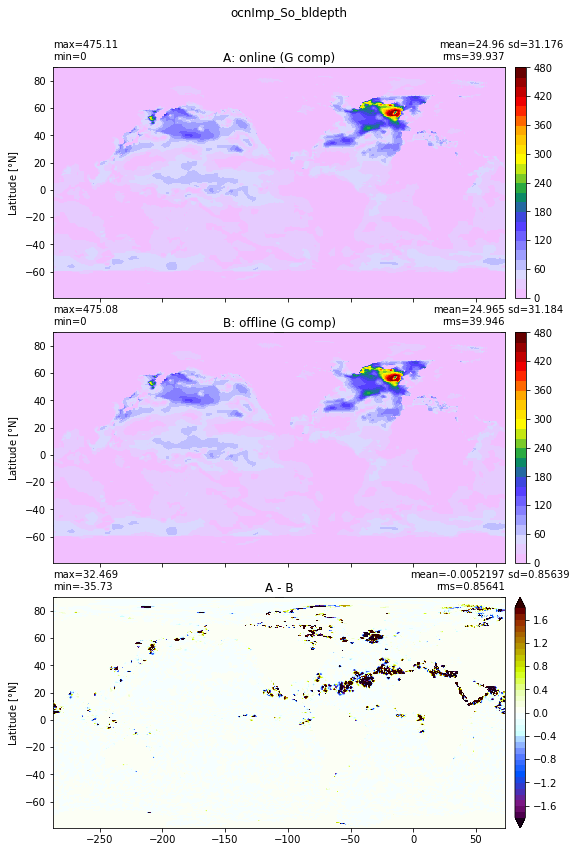

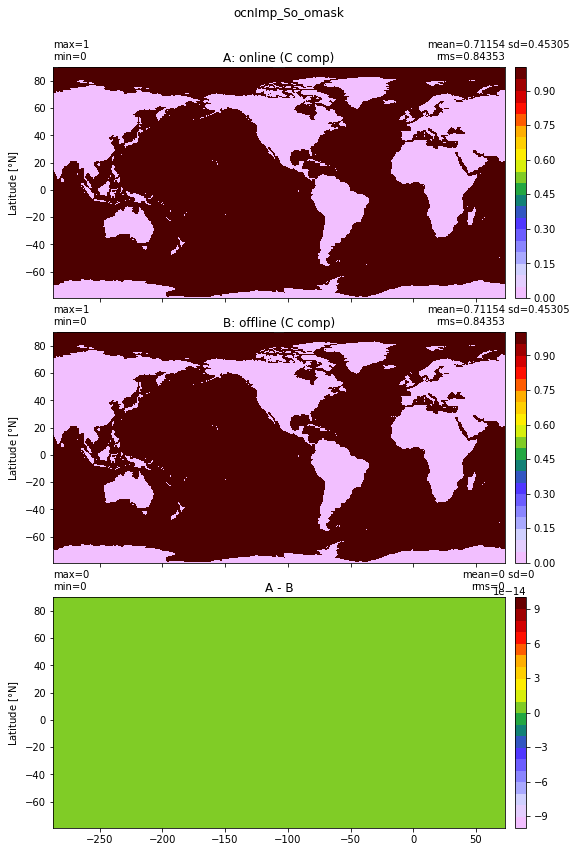

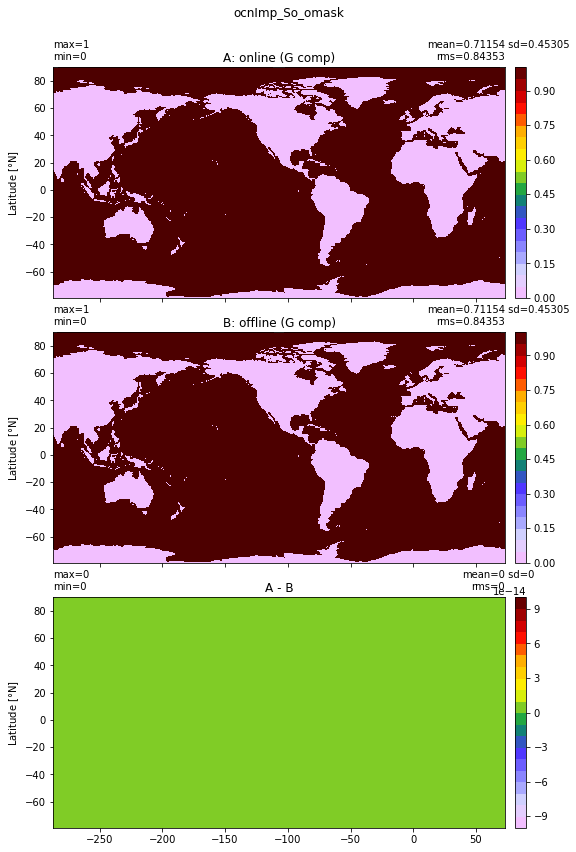

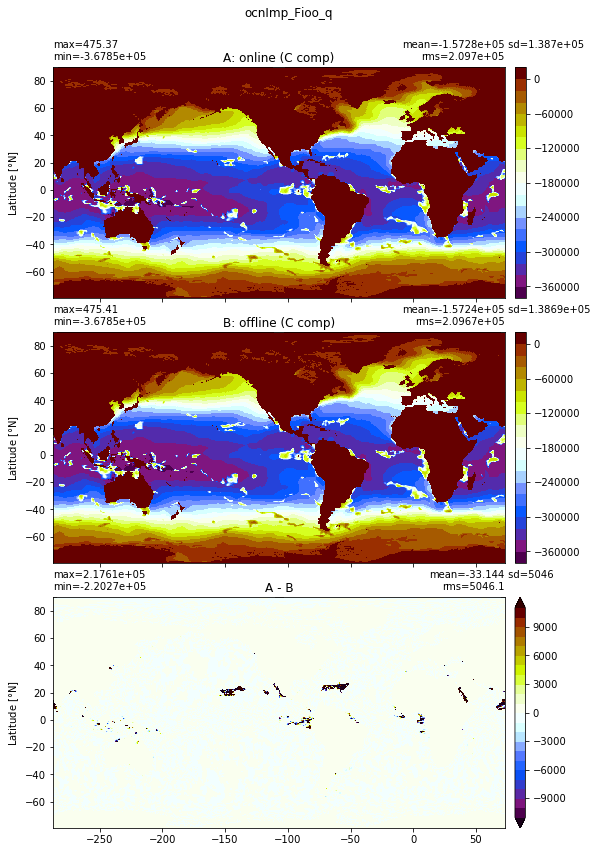

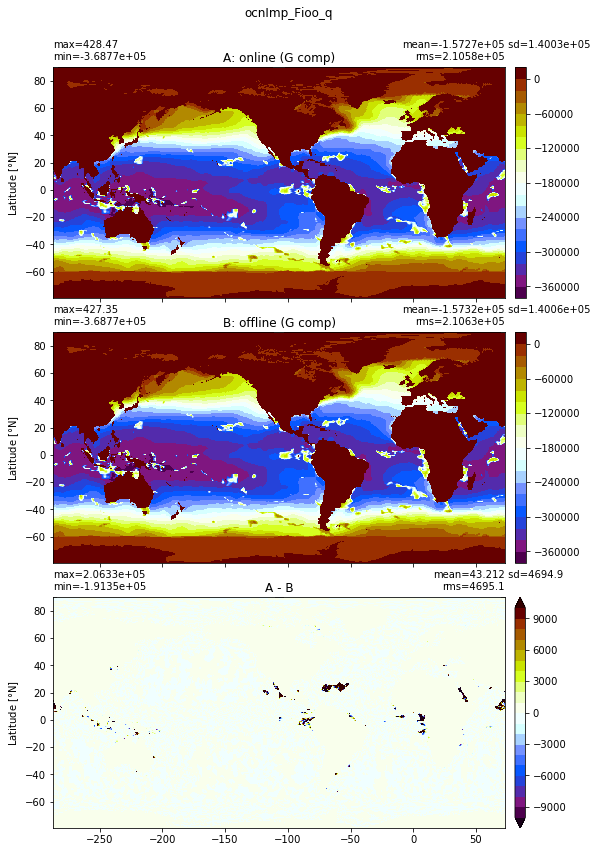

In [9]:
t = -1 # time indice
print('online C time (days) = ',online_c['time'][t].data)
print('offline C time (days) = ',offline_c['time'][t].data)
print('online G time (days) = ',online_g['time'][t].data)
print('offline G time (days) = ',offline_g['time'][t].data)

for p in range(len(pairs)):
    #print(pairs[p])
    online_var = online_c[pairs[p][0]][t,:].data
    offline_var = offline_c[pairs[p][0]][t,:].data
    xycompare(online_var, offline_var, x=grd.geolon, y=grd.geolat, area=grd.area_t, title1='online (C comp)', title2='offline (C comp)', suptitle=pairs[p][0])
    online_var = online_g[pairs[p][0]][t,:].data
    offline_var = offline_g[pairs[p][0]][t,:].data
    xycompare(online_var, offline_var, x=grd.geolon, y=grd.geolat, area=grd.area_t, title1='online (G comp)', title2='offline (G comp)', suptitle=pairs[p][0])